# Decide on QC Metrics and Thresholds

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import datetime
import pygmt
import matplotlib.pyplot as plt
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature

from pyproj import Transformer



In [3]:
test = pd.read_csv('/wd1/hbito_data/data/datasets_all_regions/Cascadia_relocated_catalog_ver_3.csv', index_col=0)
len(test)

63887

In [3]:
df = pd.read_csv('../data/datasets_all_regions/origin_2010_2015_reloc_cog_morton_ver3.csv',index_col=0)
df


,lat,lon,depth,time,orid,nass,p_picks,s_picks,rms,nsphz,gap,algorithm,id_Morton,dist,dt,NonDimDist
0,47.22533,-122.16895,56.111,1.262305e+09,0,7,2,5,1.081,5.0,235.831208,genie,0,0.753784,4.933721e+07,411143.414481
1,48.19518,-121.77276,3.820,1.262305e+09,1,55,25,30,0.985,30.0,201.698107,genie,0,1.333054,4.933712e+07,411142.646872
2,47.86208,-122.09903,17.799,1.262330e+09,2,28,10,18,0.784,18.0,181.023074,genie,0,0.957326,4.931184e+07,410932.027590
3,47.96435,-122.91906,21.286,1.262336e+09,3,20,10,10,0.465,10.0,150.528010,genie,0,0.684951,4.930621e+07,410885.088574
4,45.87262,-122.19180,9.822,1.262362e+09,4,39,20,19,0.657,19.0,237.324295,genie,0,1.627692,4.927976e+07,410664.693011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63882,40.59439,-124.42438,19.741,1.435097e+09,63882,23,9,14,1.015,14.0,73.959960,genie,4408,0.112501,7.919735e+03,65.997794
63883,40.54636,-127.10076,26.165,1.435100e+09,63883,12,1,11,0.744,11.0,223.080984,genie,4408,2.139193,9.995899e+03,83.299204
63884,49.74167,-124.58578,5.274,1.435101e+09,63884,13,7,6,0.894,6.0,197.904075,genie,4408,9.188393,1.107364e+04,92.281049
63885,40.64363,-125.36531,1.891,1.435101e+09,63885,8,3,5,0.982,5.0,145.748415,genie,4408,0.824720,1.158579e+04,96.548245


## Histogram of picks for all events

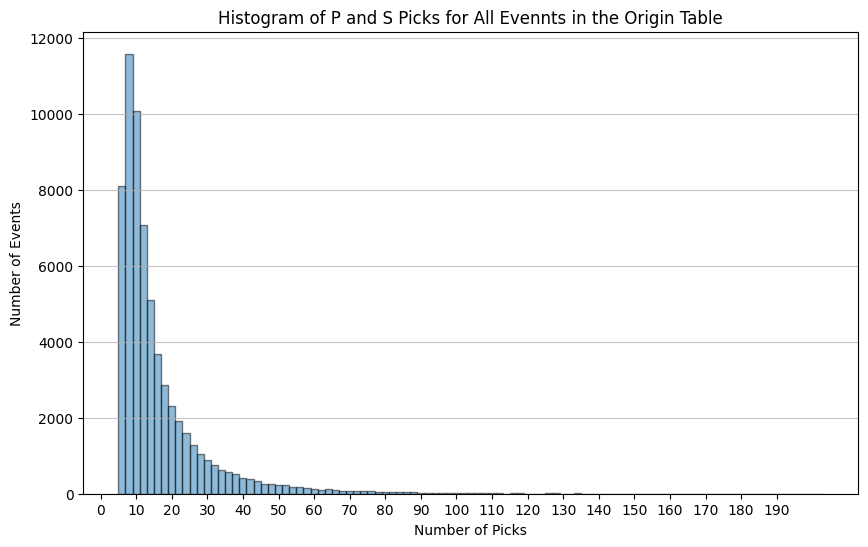

In [147]:
bins = np.linspace(df['nass'].min(), df['nass'].max(), 100)
plt.figure(figsize=(10, 6))
plt.hist(df['nass'],bins=bins, alpha=0.5, edgecolor='black')
plt.title('Histogram of P and S Picks for All Evennts in the Origin Table')
plt.xlabel('Number of Picks')
plt.ylabel('Number of Events')
plt.xticks(np.arange(0, 200, 10))
plt.grid(axis='y', alpha=0.75)

## Histogram of P picks for all events

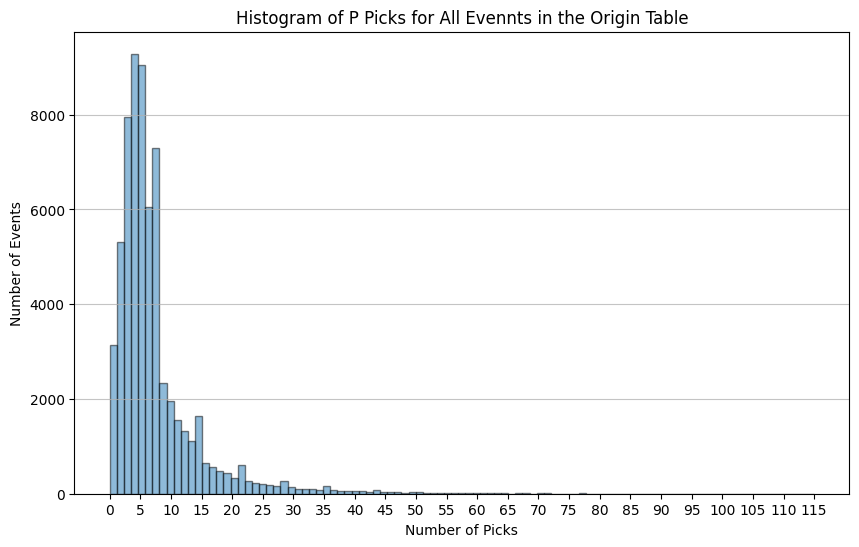

In [148]:
bins = np.linspace(df['p_picks'].min(), df['p_picks'].max(), 100)
plt.figure(figsize=(10, 6))
plt.hist(df['p_picks'],bins=bins, alpha=0.5, edgecolor='black')
plt.title('Histogram of P Picks for All Evennts in the Origin Table')
plt.xlabel('Number of Picks')
plt.ylabel('Number of Events')
plt.xticks(np.arange(0, 120, 5))

plt.grid(axis='y', alpha=0.75)

## Histogram of S picks for all events

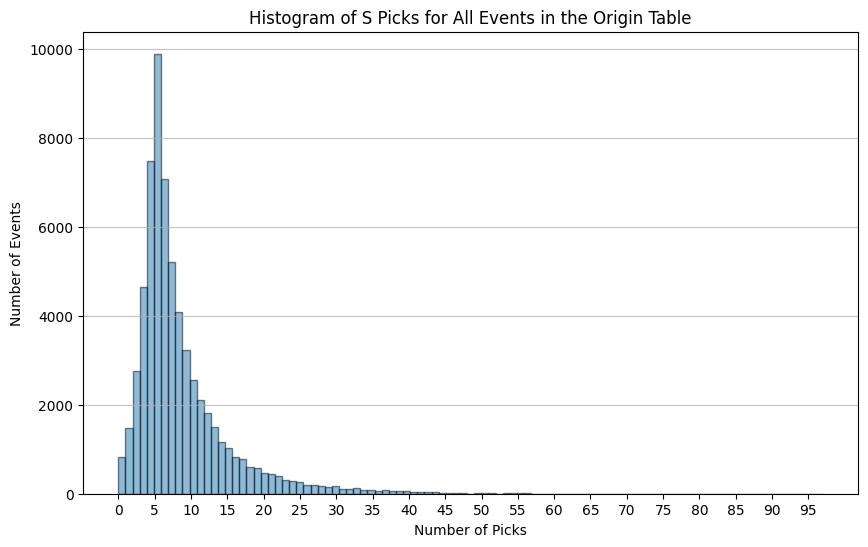

In [149]:
bins = np.linspace(df['s_picks'].min(), df['s_picks'].max(), 100)
plt.figure(figsize=(10, 6))
plt.hist(df['s_picks'],bins=bins, alpha=0.5, edgecolor='black')
plt.title('Histogram of S Picks for All Events in the Origin Table')
plt.xlabel('Number of Picks')
plt.ylabel('Number of Events')
plt.xticks(np.arange(0, 100, 5))
plt.grid(axis='y', alpha=0.75)

### Histograms of P and S picks combined

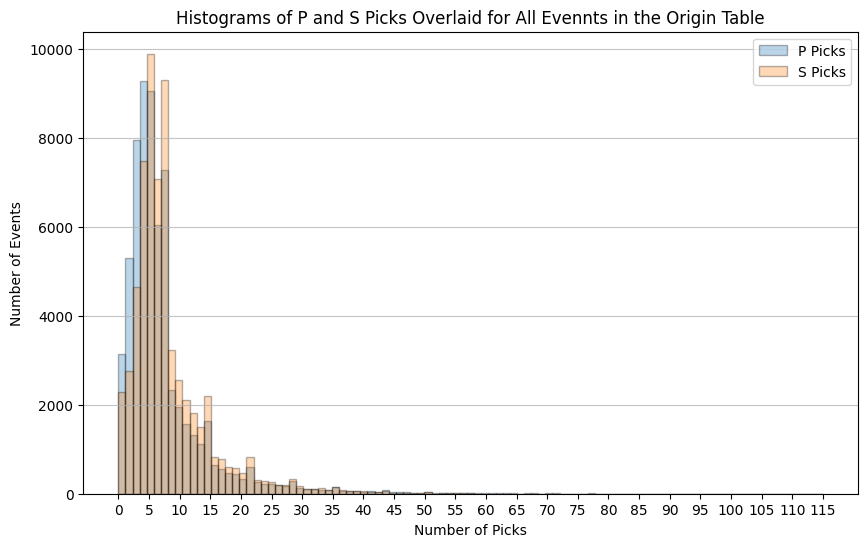

In [150]:
bins = np.linspace(df['p_picks'].min(), df['p_picks'].max(), 100)
plt.figure(figsize=(10, 6))
plt.hist(df['p_picks'],bins=bins, alpha=0.3, edgecolor='black', label='P Picks')
plt.hist(df['s_picks'], bins=bins, alpha=0.3, edgecolor='black', label='S Picks')

plt.title('Histograms of P and S Picks Overlaid for All Evennts in the Origin Table')
plt.xlabel('Number of Picks')
plt.ylabel('Number of Events')
plt.xticks(np.arange(0, 120, 5))
plt.legend()
plt.grid(axis='y', alpha=0.75)

## Histogram of RMS for all events

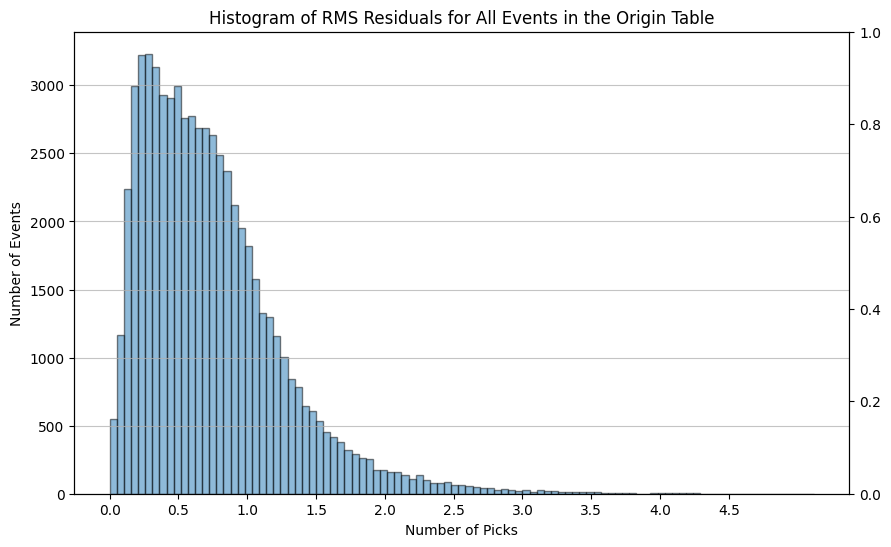

In [151]:
bins = np.linspace(df['rms'].min(), df['rms'].max(), 100)
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111)
ax2 = ax.twinx()

ax.hist(df['rms'],bins=bins, alpha=0.5, edgecolor='black')
ax.set_title('Histogram of RMS Residuals for All Events in the Origin Table')
ax.set_xlabel('Number of Picks')
ax.set_ylabel('Number of Events')
ax.set_xticks(np.arange(0, 5, 0.5))
ax.grid(axis='y', alpha=0.75)

In [152]:
ax.set_xlabel('Gap (°)')

Text(0.5, 24.0, 'Gap (°)')

## Histogram of Gap for all events

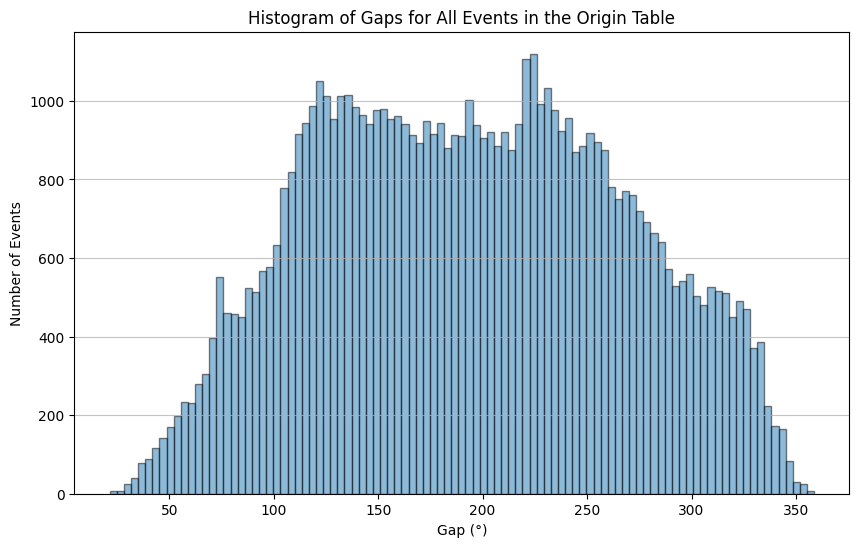

In [153]:
bins = np.linspace(df['gap'].min(), df['gap'].max(), 100)
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111)
# ax2 = ax.twinx()

ax.hist(df['gap'],bins=bins, alpha=0.5, edgecolor='black')
ax.set_title('Histogram of Gaps for All Events in the Origin Table')
ax.set_xlabel('Gap (°)')
ax.set_ylabel('Number of Events')
ax.grid(axis='y', alpha=0.75)

### Histogram of Non-Dimensional Distance
The non-dimensional distance is defined as:

$$
\text{NonDimDist} = \sqrt{\left(\frac{\Delta t}{120}\right)^2 + \left(\frac{\Delta x}{25}\right)^2}
$$

#### Histogram of Non-Dimensional Distance for all events

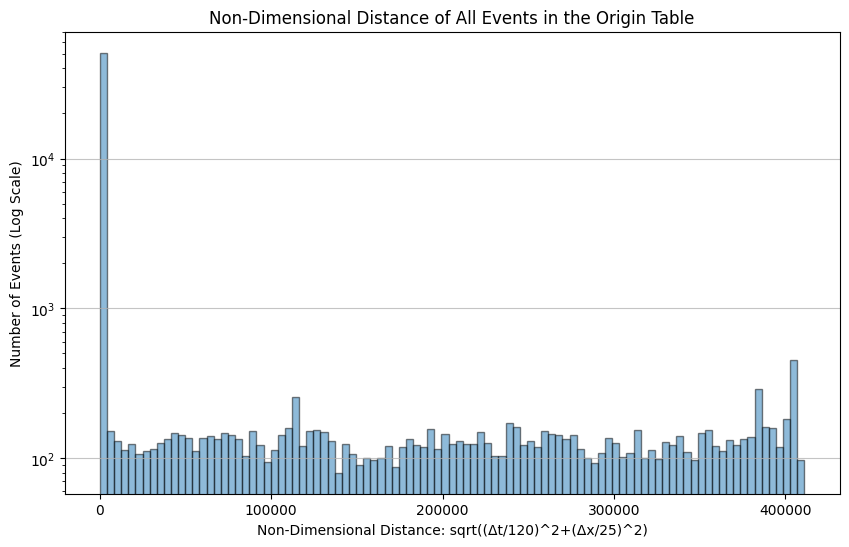

In [174]:
bins = np.linspace(df['NonDimDist'].min(), df['NonDimDist'].max(), 100)
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111)
# ax2 = ax.twinx()

ax.hist(df['NonDimDist'],bins=bins, alpha=0.5, edgecolor='black')
ax.set_yscale('log')
ax.set_title('Non-Dimensional Distance of All Events in the Origin Table')
ax.set_xlabel('Non-Dimensional Distance: sqrt((Δt/120)^2+(Δx/25)^2)')
ax.set_ylabel('Number of Events (Log Scale)')
ax.grid(axis='y', alpha=0.75)

#### Histogram of Non-Dimensional Distance with NonDimDist < 0.1

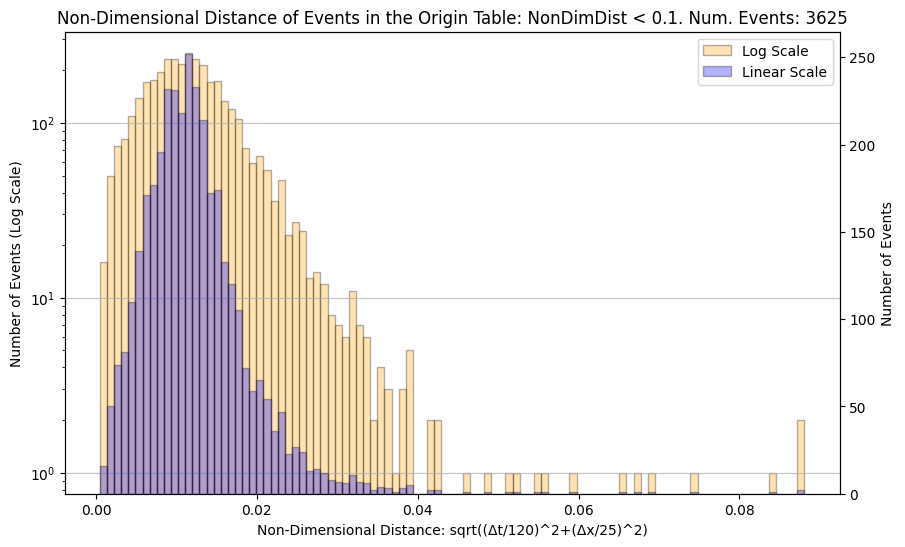

In [155]:
thd_non_dim_dist = 0.1
df_filter1 = df[df['NonDimDist'] < thd_non_dim_dist]
bins = np.linspace(df_filter1['NonDimDist'].min(), df_filter1['NonDimDist'].max(), 100)
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111)
ax2 = ax.twinx()

ax2.hist(df_filter1['NonDimDist'],bins=bins, alpha=0.3, edgecolor='black',color='blue',label="Linear Scale")
ax2.set_ylabel('Number of Events')

ax.hist(df_filter1['NonDimDist'],bins=bins, alpha=0.3, edgecolor='black',color='orange',label="Log Scale")
ax.set_yscale('log')
ax.set_title(f'Non-Dimensional Distance of Events in the Origin Table: NonDimDist < {thd_non_dim_dist}. Num. Events: {len(df_filter1)}')
ax.set_xlabel('Non-Dimensional Distance: sqrt((Δt/120)^2+(Δx/25)^2)')
ax.set_ylabel('Number of Events (Log Scale)')
ax.grid(axis='y', alpha=0.75)

# Get handles and labels from both axes
handles1, labels1 = ax.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()

# Combine them
handles = handles1 + handles2
labels = labels1 + labels2

# Add the combined legend to one of the axes
ax.legend(handles, labels, loc='upper right')




#### Histogram of Non-Dimensional Distance with NonDimDist < 0.2

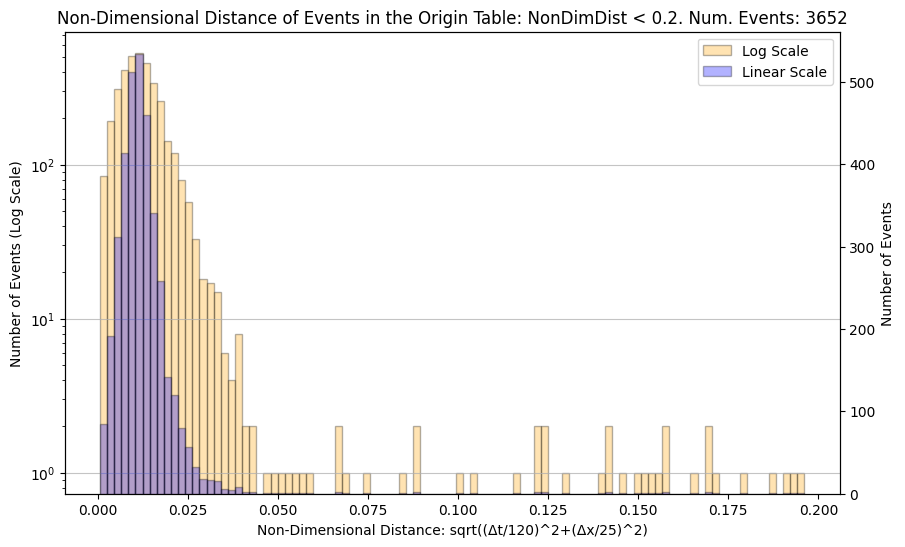

In [156]:
thd_non_dim_dist = 0.2
df_filter3 = df[df['NonDimDist'] < thd_non_dim_dist]
bins = np.linspace(df_filter3['NonDimDist'].min(), df_filter3['NonDimDist'].max(), 100)
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111)
ax2 = ax.twinx()

ax2.hist(df_filter3['NonDimDist'],bins=bins, alpha=0.3, edgecolor='black',color='blue',label="Linear Scale")
ax2.set_ylabel('Number of Events')

ax.hist(df_filter3['NonDimDist'],bins=bins, alpha=0.3, edgecolor='black',color='orange',label="Log Scale")
ax.set_yscale('log')
ax.set_title(f'Non-Dimensional Distance of Events in the Origin Table: NonDimDist < {thd_non_dim_dist}. Num. Events: {len(df_filter3)}')
ax.set_xlabel('Non-Dimensional Distance: sqrt((Δt/120)^2+(Δx/25)^2)')
ax.set_ylabel('Number of Events (Log Scale)')
ax.grid(axis='y', alpha=0.75)

# Get handles and labels from both axes
handles1, labels1 = ax.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()

# Combine them
handles = handles1 + handles2
labels = labels1 + labels2

# Add the combined legend to one of the axes
ax.legend(handles, labels, loc='upper right')




#### Histogram of Non-Dimensional Distance with NonDimDist < sqrt(2)

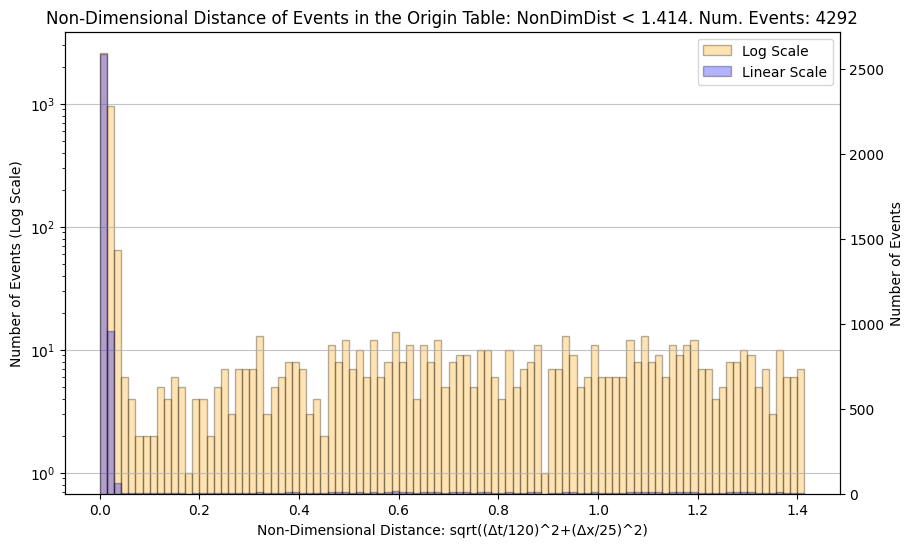

In [157]:
thd_non_dim_dist = np.sqrt(2)
df_filter2 = df[df['NonDimDist'] < thd_non_dim_dist]
bins = np.linspace(df_filter2['NonDimDist'].min(), df_filter2['NonDimDist'].max(), 100)
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111)
ax2 = ax.twinx()

ax2.hist(df_filter2['NonDimDist'],bins=bins, alpha=0.3, edgecolor='black',color='blue',label="Linear Scale")
ax2.set_ylabel('Number of Events')

ax.hist(df_filter2['NonDimDist'],bins=bins, alpha=0.3, edgecolor='black',color='orange',label="Log Scale")
ax.set_yscale('log')
ax.set_title(f'Non-Dimensional Distance of Events in the Origin Table: NonDimDist < {round(thd_non_dim_dist,3)}. Num. Events: {len(df_filter2)}')
ax.set_xlabel('Non-Dimensional Distance: sqrt((Δt/120)^2+(Δx/25)^2)')
ax.set_ylabel('Number of Events (Log Scale)')
ax.grid(axis='y', alpha=0.75)

# Get handles and labels from both axes
handles1, labels1 = ax.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()

# Combine them
handles = handles1 + handles2
labels = labels1 + labels2

# Add the combined legend to one of the axes
ax.legend(handles, labels, loc='upper right')




### Filter by RMS

#### P and S Picks > 4 and RMS < 1

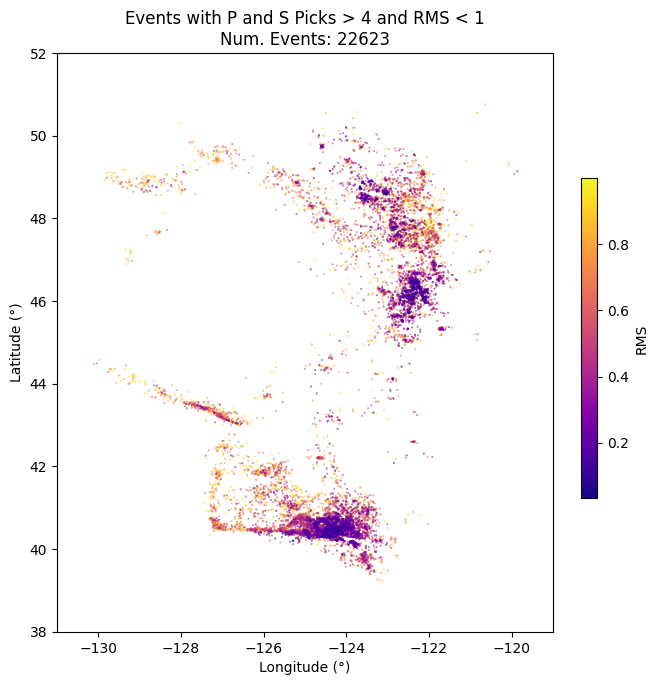

In [158]:
plt.figure(figsize=(8, 8))

# Filter and sort the data
_df = df[(df.rms<1) & (df.p_picks > 4) & (df.s_picks > 4)].sort_values('rms', ascending=False)

# Create the scatter plot
scatter = plt.scatter(
    _df['lon'], _df['lat'], 
    c=_df['rms'], cmap='plasma', s=0.1
)

# Add a colorbar with a label
cbar = plt.colorbar(scatter, label='RMS')
cbar.ax.set_position([0.78, 0.3, 0.03, 0.4])  # Adjust colorbar position

# Add labels, title, and axis limits
plt.xlabel('Longitude (°)')
plt.ylabel('Latitude (°)')
plt.title(f'Events with P and S Picks > 4 and RMS < 1\nNum. Events: {len(_df)}')
plt.xlim(-131, -119)
plt.ylim(38, 52)

# Ensure the aspect ratio is equal
plt.gca().set_aspect('equal', adjustable='box')

# Show the plot
plt.show()

#### P and S Picks > 4 and RMS < 1.5

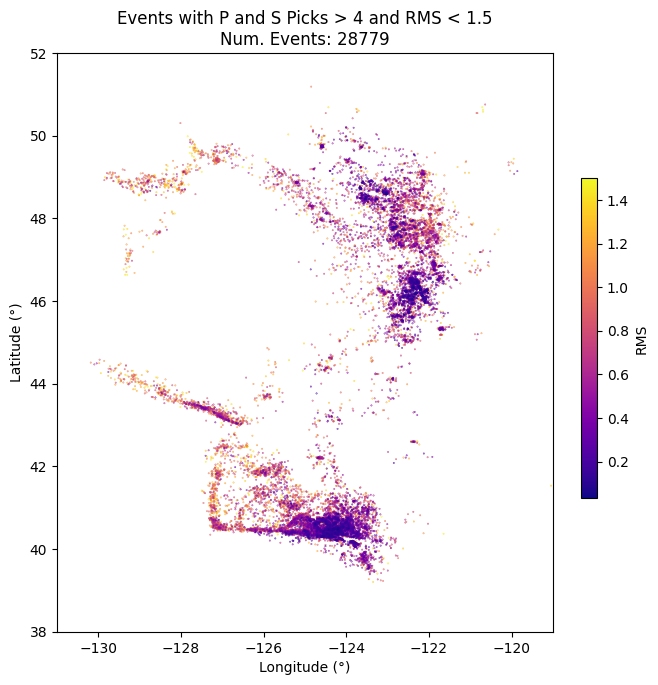

In [159]:
plt.figure(figsize=(8, 8))

# Filter and sort the data
_df = df[(df.rms<1.5) & (df.p_picks > 4) & (df.s_picks > 4)].sort_values('rms', ascending=False)

# Create the scatter plot
scatter = plt.scatter(
    _df['lon'], _df['lat'], 
    c=_df['rms'], cmap='plasma', s=0.1
)

# Add a colorbar with a label
cbar = plt.colorbar(scatter, label='RMS')
cbar.ax.set_position([0.78, 0.3, 0.03, 0.4])  # Adjust colorbar position

# Add labels, title, and axis limits
plt.xlabel('Longitude (°)')
plt.ylabel('Latitude (°)')
plt.title(f'Events with P and S Picks > 4 and RMS < 1.5\nNum. Events: {len(_df)}')
plt.xlim(-131, -119)
plt.ylim(38, 52)

# Ensure the aspect ratio is equal
plt.gca().set_aspect('equal', adjustable='box')

# Show the plot
plt.show()

#### P and S Picks > 4 and RMS < 2.0

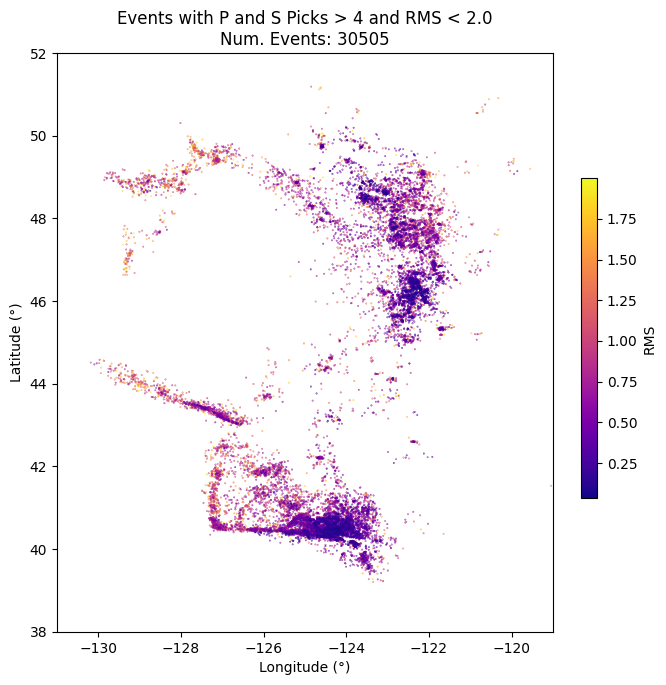

In [160]:
plt.figure(figsize=(8, 8))

# Filter and sort the data
_df = df[(df.rms<2) & (df.p_picks > 4) & (df.s_picks > 4)].sort_values('rms', ascending=False)

# Create the scatter plot
scatter = plt.scatter(
    _df['lon'], _df['lat'], 
    c=_df['rms'], cmap='plasma', s=0.1
)

# Add a colorbar with a label
cbar = plt.colorbar(scatter, label='RMS')
cbar.ax.set_position([0.78, 0.3, 0.03, 0.4])  # Adjust colorbar position

# Add labels, title, and axis limits
plt.xlabel('Longitude (°)')
plt.ylabel('Latitude (°)')
plt.title(f'Events with P and S Picks > 4 and RMS < 2.0\nNum. Events: {len(_df)}')
plt.xlim(-131, -119)
plt.ylim(38, 52)

# Ensure the aspect ratio is equal
plt.gca().set_aspect('equal', adjustable='box')

# Show the plot
plt.show()

#### P and S Picks > 4 and RMS < 2.5

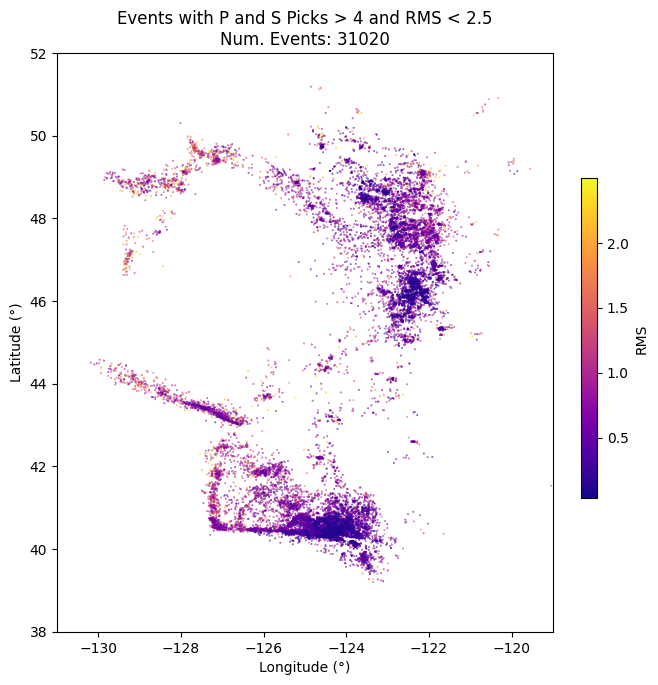

In [4]:
plt.figure(figsize=(8, 8))

# Filter and sort the data
_df = df[(df.rms<2.5) & (df.p_picks > 4) & (df.s_picks > 4)].sort_values('rms', ascending=False)

# Create the scatter plot
scatter = plt.scatter(
    _df['lon'], _df['lat'], 
    c=_df['rms'], cmap='plasma', s=0.1
)

# Add a colorbar with a label
cbar = plt.colorbar(scatter, label='RMS')
cbar.ax.set_position([0.78, 0.3, 0.03, 0.4])  # Adjust colorbar position

# Add labels, title, and axis limits
plt.xlabel('Longitude (°)')
plt.ylabel('Latitude (°)')
plt.title(f'Events with P and S Picks > 4 and RMS < 2.5\nNum. Events: {len(_df)}')
plt.xlim(-131, -119)
plt.ylim(38, 52)

# Ensure the aspect ratio is equal
plt.gca().set_aspect('equal', adjustable='box')

# Show the plot
plt.show()

In [5]:
_df.to_csv('../data/datasets_all_regions/origin_2010_2015_reloc_cog_morton_ver3_p_4_s_4_rms_2_5.csv')

In [6]:
_df

,lat,lon,depth,time,orid,nass,p_picks,s_picks,rms,nsphz,gap,algorithm,id_Morton,dist,dt,NonDimDist
27593,40.46402,-124.63921,21.674,1.350339e+09,27593,33,14,19,2.498,19.0,70.689876,genie,676,0.043925,1.489598e+00,0.012537
33313,40.46453,-124.64685,19.221,1.363883e+09,33313,23,9,14,2.497,14.0,104.305083,genie,1239,0.064674,1.564381e+03,13.036509
44330,49.75784,-123.42677,4.296,1.395439e+09,44330,10,5,5,2.494,5.0,273.037707,genie,1821,1.710027,9.866703e+03,82.222555
42581,49.04914,-122.09718,13.249,1.393710e+09,42581,26,16,10,2.491,10.0,254.509741,genie,1805,1.868034,6.251413e+04,520.951049
36355,40.39732,-124.58839,16.076,1.371875e+09,36355,22,9,13,2.491,13.0,206.224926,genie,1556,0.607235,5.253552e+04,437.796015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1542,46.14740,-122.14032,44.614,1.266069e+09,1542,10,5,5,0.044,5.0,123.524895,genie,0,1.406842,4.557335e+07,379777.923383
8390,48.79538,-123.26321,-0.782,1.293723e+09,8390,10,5,5,0.043,5.0,159.143198,genie,0,1.473689,1.791899e+07,149324.956402
8590,48.57995,-123.03222,13.812,1.294554e+09,8590,10,5,5,0.042,5.0,230.479217,genie,0,1.268354,1.708779e+07,142398.279265
41383,46.32146,-122.37012,13.638,1.390093e+09,41383,10,5,5,0.036,5.0,260.537377,genie,1768,2.804629,1.094893e+04,91.241118


In [42]:
df_arrival = pd.read_csv('../data/datasets_all_regions/arrival_2010_2015_reloc_cog_ver3.csv',index_col=0)
df_arrival

,time,arid,iphase,prob
sta,,,,
UW.PCMD,2010-01-01T00:15:27.180000Z,0,P,0.680
UW.RVW,2010-01-01T00:15:37.840400Z,1,P,0.680
UW.PCMD,2010-01-01T00:15:33.280000Z,2,S,0.680
UW.GNW,2010-01-01T00:15:42.002000Z,3,S,0.680
PB.B013,2010-01-01T00:15:43.618400Z,4,S,0.680
...,...,...,...,...
7D.J11D,2015-06-23T23:18:40.885798Z,1004330,S,0.694
7D.G35D,2015-06-23T23:18:48.573898Z,1004331,S,0.694
7D.J19D,2015-06-23T23:18:50.458298Z,1004332,S,0.694


In [43]:
df_assoc = pd.read_csv('../data/datasets_all_regions/assoc_2010_2015_reloc_cog_ver3.csv',index_col=0)[['orid','arid','sta']]
df_assoc

,orid,arid,sta
0,0,0,UW.PCMD
1,0,1,UW.RVW
2,0,2,UW.PCMD
3,0,3,UW.GNW
4,0,4,PB.B013
...,...,...,...
1004330,63886,1004330,7D.J11D
1004331,63886,1004331,7D.G35D
1004332,63886,1004332,7D.J19D
1004333,63886,1004333,7D.J10D


In [44]:
df_picks = df_assoc.merge(df_arrival, on='arid', how='inner')[['orid','arid','sta','iphase','time']]
df_picks = df_picks.rename(columns={'time':'time_pick'})
df_picks

,orid,arid,sta,iphase,time_pick
0,0,0,UW.PCMD,P,2010-01-01T00:15:27.180000Z
1,0,1,UW.RVW,P,2010-01-01T00:15:37.840400Z
2,0,2,UW.PCMD,S,2010-01-01T00:15:33.280000Z
3,0,3,UW.GNW,S,2010-01-01T00:15:42.002000Z
4,0,4,PB.B013,S,2010-01-01T00:15:43.618400Z
...,...,...,...,...,...
1004330,63886,1004330,7D.J11D,S,2015-06-23T23:18:40.885798Z
1004331,63886,1004331,7D.G35D,S,2015-06-23T23:18:48.573898Z
1004332,63886,1004332,7D.J19D,S,2015-06-23T23:18:50.458298Z
1004333,63886,1004333,7D.J10D,S,2015-06-23T23:18:56.689277Z


In [45]:
df_pick_assignments = _df.merge(df_picks, on='orid', how='inner')
df_pick_assignments

,Unnamed: 0,lat,lon,depth,time,orid,nass,p_picks,s_picks,rms,...,algorithm,id_Morton,dist,dt,NonDimDist,datetime,arid,sta,iphase,time_pick
0,27593,40.46402,-124.63921,21.674,1.350339e+09,27593,33,14,19,2.498,...,genie,676,0.043925,1.489598e+00,0.012537,2012-10-15 22:03:37.489598+00:00,416705,7D.FS10B,P,2012-10-15T22:03:42.932152Z
1,27593,40.46402,-124.63921,21.674,1.350339e+09,27593,33,14,19,2.498,...,genie,676,0.043925,1.489598e+00,0.012537,2012-10-15 22:03:37.489598+00:00,416706,7D.FS01B,P,2012-10-15T22:03:43.400762Z
2,27593,40.46402,-124.63921,21.674,1.350339e+09,27593,33,14,19,2.498,...,genie,676,0.043925,1.489598e+00,0.012537,2012-10-15 22:03:37.489598+00:00,416707,7D.FS04B,P,2012-10-15T22:03:43.404052Z
3,27593,40.46402,-124.63921,21.674,1.350339e+09,27593,33,14,19,2.498,...,genie,676,0.043925,1.489598e+00,0.012537,2012-10-15 22:03:37.489598+00:00,416708,7D.FS20B,P,2012-10-15T22:03:43.466048Z
4,27593,40.46402,-124.63921,21.674,1.350339e+09,27593,33,14,19,2.498,...,genie,676,0.043925,1.489598e+00,0.012537,2012-10-15 22:03:37.489598+00:00,416709,NC.KCT,P,2012-10-15T22:03:44.190000Z
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
730148,774,48.46791,-123.44927,20.314,1.264059e+09,774,10,5,5,0.032,...,genie,0,1.152438,4.758315e+07,396526.218818,2010-01-21 07:29:40.741805+00:00,9779,PB.B009,S,2010-01-21T07:29:48.018400Z
730149,774,48.46791,-123.44927,20.314,1.264059e+09,774,10,5,5,0.032,...,genie,0,1.152438,4.758315e+07,396526.218818,2010-01-21 07:29:40.741805+00:00,9780,PB.B010,S,2010-01-21T07:29:48.068400Z
730150,774,48.46791,-123.44927,20.314,1.264059e+09,774,10,5,5,0.032,...,genie,0,1.152438,4.758315e+07,396526.218818,2010-01-21 07:29:40.741805+00:00,9781,PB.B006,S,2010-01-21T07:29:54.388400Z
730151,774,48.46791,-123.44927,20.314,1.264059e+09,774,10,5,5,0.032,...,genie,0,1.152438,4.758315e+07,396526.218818,2010-01-21 07:29:40.741805+00:00,9782,PB.B005,S,2010-01-21T07:29:54.428400Z


In [14]:
_df["datetime"] = _df["time"].apply(datetime.datetime.fromtimestamp, tz=datetime.timezone.utc)
_df

,lat,lon,depth,time,orid,nass,p_picks,s_picks,rms,nsphz,gap,algorithm,id_Morton,dist,dt,NonDimDist,datetime
27593,40.46402,-124.63921,21.674,1.350339e+09,27593,33,14,19,2.498,19.0,70.689876,genie,676,0.043925,1.489598e+00,0.012537,2012-10-15 22:03:37.489598+00:00
33313,40.46453,-124.64685,19.221,1.363883e+09,33313,23,9,14,2.497,14.0,104.305083,genie,1239,0.064674,1.564381e+03,13.036509,2013-03-21 16:22:28.381014+00:00
44330,49.75784,-123.42677,4.296,1.395439e+09,44330,10,5,5,2.494,5.0,273.037707,genie,1821,1.710027,9.866703e+03,82.222555,2014-03-21 21:53:00.703153+00:00
42581,49.04914,-122.09718,13.249,1.393710e+09,42581,26,16,10,2.491,10.0,254.509741,genie,1805,1.868034,6.251413e+04,520.951049,2014-03-01 21:39:46.874711+00:00
36355,40.39732,-124.58839,16.076,1.371875e+09,36355,22,9,13,2.491,13.0,206.224926,genie,1556,0.607235,5.253552e+04,437.796015,2013-06-22 04:16:06.478228+00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1542,46.14740,-122.14032,44.614,1.266069e+09,1542,10,5,5,0.044,5.0,123.524895,genie,0,1.406842,4.557335e+07,379777.923383,2010-02-13 13:46:16.194077+00:00
8390,48.79538,-123.26321,-0.782,1.293723e+09,8390,10,5,5,0.043,5.0,159.143198,genie,0,1.473689,1.791899e+07,149324.956402,2010-12-30 15:32:12.231767+00:00
8590,48.57995,-123.03222,13.812,1.294554e+09,8590,10,5,5,0.042,5.0,230.479217,genie,0,1.268354,1.708779e+07,142398.279265,2011-01-09 06:25:33.488215+00:00
41383,46.32146,-122.37012,13.638,1.390093e+09,41383,10,5,5,0.036,5.0,260.537377,genie,1768,2.804629,1.094893e+04,91.241118,2014-01-19 00:59:04.074082+00:00


,time,arid,iphase,prob
sta,,,,
UW.PCMD,2010-01-01T00:15:27.180000Z,0,P,0.680
UW.RVW,2010-01-01T00:15:37.840400Z,1,P,0.680
UW.PCMD,2010-01-01T00:15:33.280000Z,2,S,0.680
UW.GNW,2010-01-01T00:15:42.002000Z,3,S,0.680
PB.B013,2010-01-01T00:15:43.618400Z,4,S,0.680
...,...,...,...,...
7D.J11D,2015-06-23T23:18:40.885798Z,1004330,S,0.694
7D.G35D,2015-06-23T23:18:48.573898Z,1004331,S,0.694
7D.J19D,2015-06-23T23:18:50.458298Z,1004332,S,0.694


In [15]:
_df

,lat,lon,depth,time,orid,nass,p_picks,s_picks,rms,nsphz,gap,algorithm,id_Morton,dist,dt,NonDimDist,datetime
27593,40.46402,-124.63921,21.674,1.350339e+09,27593,33,14,19,2.498,19.0,70.689876,genie,676,0.043925,1.489598e+00,0.012537,2012-10-15 22:03:37.489598+00:00
33313,40.46453,-124.64685,19.221,1.363883e+09,33313,23,9,14,2.497,14.0,104.305083,genie,1239,0.064674,1.564381e+03,13.036509,2013-03-21 16:22:28.381014+00:00
44330,49.75784,-123.42677,4.296,1.395439e+09,44330,10,5,5,2.494,5.0,273.037707,genie,1821,1.710027,9.866703e+03,82.222555,2014-03-21 21:53:00.703153+00:00
42581,49.04914,-122.09718,13.249,1.393710e+09,42581,26,16,10,2.491,10.0,254.509741,genie,1805,1.868034,6.251413e+04,520.951049,2014-03-01 21:39:46.874711+00:00
36355,40.39732,-124.58839,16.076,1.371875e+09,36355,22,9,13,2.491,13.0,206.224926,genie,1556,0.607235,5.253552e+04,437.796015,2013-06-22 04:16:06.478228+00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1542,46.14740,-122.14032,44.614,1.266069e+09,1542,10,5,5,0.044,5.0,123.524895,genie,0,1.406842,4.557335e+07,379777.923383,2010-02-13 13:46:16.194077+00:00
8390,48.79538,-123.26321,-0.782,1.293723e+09,8390,10,5,5,0.043,5.0,159.143198,genie,0,1.473689,1.791899e+07,149324.956402,2010-12-30 15:32:12.231767+00:00
8590,48.57995,-123.03222,13.812,1.294554e+09,8590,10,5,5,0.042,5.0,230.479217,genie,0,1.268354,1.708779e+07,142398.279265,2011-01-09 06:25:33.488215+00:00
41383,46.32146,-122.37012,13.638,1.390093e+09,41383,10,5,5,0.036,5.0,260.537377,genie,1768,2.804629,1.094893e+04,91.241118,2014-01-19 00:59:04.074082+00:00


In [38]:
_df = pd.read_csv('../data/datasets_all_regions/origin_2010_2015_reloc_cog_morton_ver3_p_4_s_4_rms_2_5.csv')
_df["datetime"] = pd.to_datetime(_df["time"].apply(datetime.datetime.fromtimestamp, tz=datetime.timezone.utc))

#### P and S Picks > 4 and RMS < 5

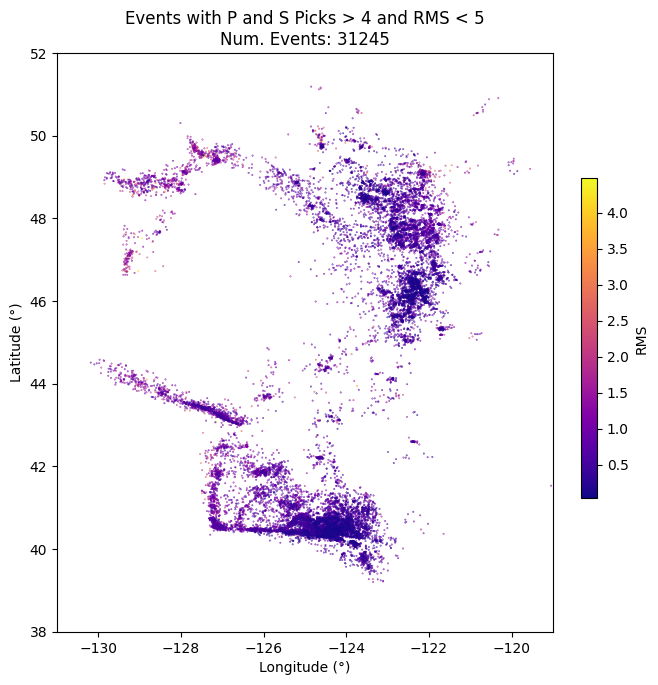

In [162]:
plt.figure(figsize=(8, 8))

# Filter and sort the data
_df = df[(df.rms<5) & (df.p_picks > 4) & (df.s_picks > 4)].sort_values('rms', ascending=False)

# Create the scatter plot
scatter = plt.scatter(
    _df['lon'], _df['lat'], 
    c=_df['rms'], cmap='plasma', s=0.1
)

# Add a colorbar with a label
cbar = plt.colorbar(scatter, label='RMS')
cbar.ax.set_position([0.78, 0.3, 0.03, 0.4])  # Adjust colorbar position

# Add labels, title, and axis limits
plt.xlabel('Longitude (°)')
plt.ylabel('Latitude (°)')
plt.title(f'Events with P and S Picks > 4 and RMS < 5\nNum. Events: {len(_df)}')
plt.xlim(-131, -119)
plt.ylim(38, 52)

# Ensure the aspect ratio is equal
plt.gca().set_aspect('equal', adjustable='box')

# Show the plot
plt.show()

In [8]:
import pygmt
import pandas as pd

# Filter and sort data
_df = df[(df.rms < 2.5) & (df.p_picks > 4) & (df.s_picks > 4)].sort_values('rms', ascending=False)

# Define region
region = [-131, -119, 38, 52]

# Create figure
fig = pygmt.Figure()

# Use @earth_relief_03m for decent resolution
grid = "@earth_relief_03m"

# Make CPT: emphasize bathymetry (e.g., only negative values)
fig.makecpt(
    cmap="oleron",  # Good diverging CPT for bathymetry
    series="-8000/0/500",  # Depth range in meters
    continuous=True
)

# Plot ocean bathymetry (negative elevations only)
fig.grdimage(
    grid=grid,
    region=region,
    projection="M8i",
    shading=True,
    cmap=True,
    nan_transparent=True
)

# Add contours for bathymetry (optional)
fig.grdcontour(
    grid=grid,
    interval=1000,
    annotation="1000+f6p",
    limit=[-8000, 0],
    pen="0.5p,gray"
)

# Draw land (to mask non-ocean areas)
fig.coast(
    region=region,
    projection="M8i",
    land="lightgray",
    shorelines="1/0.2p,black",
    borders=[1],
    water=None,
    resolution="i",
    frame=["af", '+t"Events with RMS < 2.5 and P,S Picks > 4"']
)

# Plot your seismic events
fig.plot(
    x=_df["lon"],
    y=_df["lat"],
    style="c0.05c",
    color=_df["rms"],
    cmap="plasma",
    pen="thin,black"
)

# Add a separate colorbar for the event RMS
fig.colorbar(position="JMR+o0.8c/0c+w6c/0.3c+h", cmap="plasma", frame=["af", "+lRMS"])

# Add bathymetry colorbar (optional, for ocean)
fig.colorbar(position="JBL+o0.2c/0.5c+w6c/0.3c+h", frame=["af", "+lElevation (m)"])

# Add number of events in corner
fig.text(
    text=f"Num. Events: {len(_df)}",
    position="TL",
    offset="j0.3c/0.3c",
    font="12p,Helvetica-Bold,black"
)

# Show plot
fig.show()


AttributeError: 'Figure' object has no attribute 'makecpt'

grdimage [ERROR]: Option -Q: Cannot specify a transparent color for grids when intensities are also used
/tmp/ipykernel_540211/1673196240.py:57: FutureWarning: The 'color' parameter has been deprecated since v0.8.0 and will be removed in v0.12.0. Please use 'fill' instead.
  fig.plot(


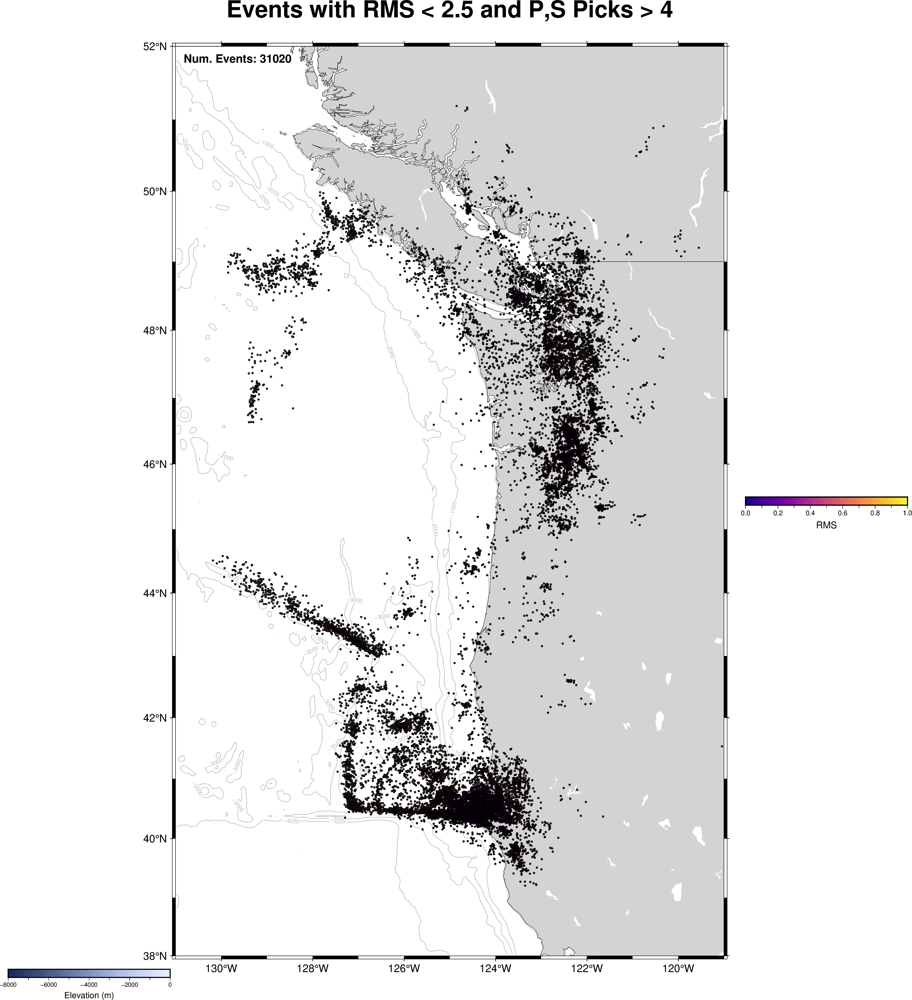

In [11]:
import pygmt
import pandas as pd

# Filter and sort data
_df = df[(df.rms < 2.5) & (df.p_picks > 4) & (df.s_picks > 4)].sort_values('rms', ascending=False)

# Define region
region = [-131, -119, 38, 52]

# Create figure
fig = pygmt.Figure()

# Use @earth_relief_03m for decent resolution
grid = "@earth_relief_03m"

# Make CPT: emphasize bathymetry (e.g., only negative values)
import pygmt

# Create a CPT using pygmt.makecpt
pygmt.makecpt(
    cmap="oleron",  # Good diverging CPT for bathymetry
    series="-8000/0/500",  # Depth range in meters
    continuous=True
)

# Continue with the rest of the code
fig.grdimage(
    grid=grid,
    region=region,
    projection="M8i",
    shading=True,
    cmap=True,
    nan_transparent=True
)
# Add contours for bathymetry (optional)
fig.grdcontour(
    grid=grid,
    interval=1000,
    annotation="1000+f6p",
    limit=[-8000, 0],
    pen="0.5p,gray"
)

# Draw land (to mask non-ocean areas)
fig.coast(
    region=region,
    projection="M8i",
    land="lightgray",
    shorelines="1/0.2p,black",
    borders=[1],
    water=None,
    resolution="i",
    frame=["af", '+t"Events with RMS < 2.5 and P,S Picks > 4"']
)

# Plot your seismic events
fig.plot(
    x=_df["lon"],
    y=_df["lat"],
    style="c0.05c",
    color=_df["rms"],
    cmap="plasma",
    pen="thin,black"
)

# Add a separate colorbar for the event RMS
fig.colorbar(position="JMR+o0.8c/0c+w6c/0.3c+h", cmap="plasma", frame=["af", "+lRMS"])

# Add bathymetry colorbar (optional, for ocean)
fig.colorbar(position="JBL+o0.2c/0.5c+w6c/0.3c+h", frame=["af", "+lElevation (m)"])

# Add number of events in corner
fig.text(
    text=f"Num. Events: {len(_df)}",
    position="TL",
    offset="j0.3c/0.3c",
    font="12p,Helvetica-Bold,black"
)

# Show plot
fig.show()

/tmp/ipykernel_540211/2351263240.py:27: FutureWarning: The 'color' parameter has been deprecated since v0.8.0 and will be removed in v0.12.0. Please use 'fill' instead.
  fig.plot(


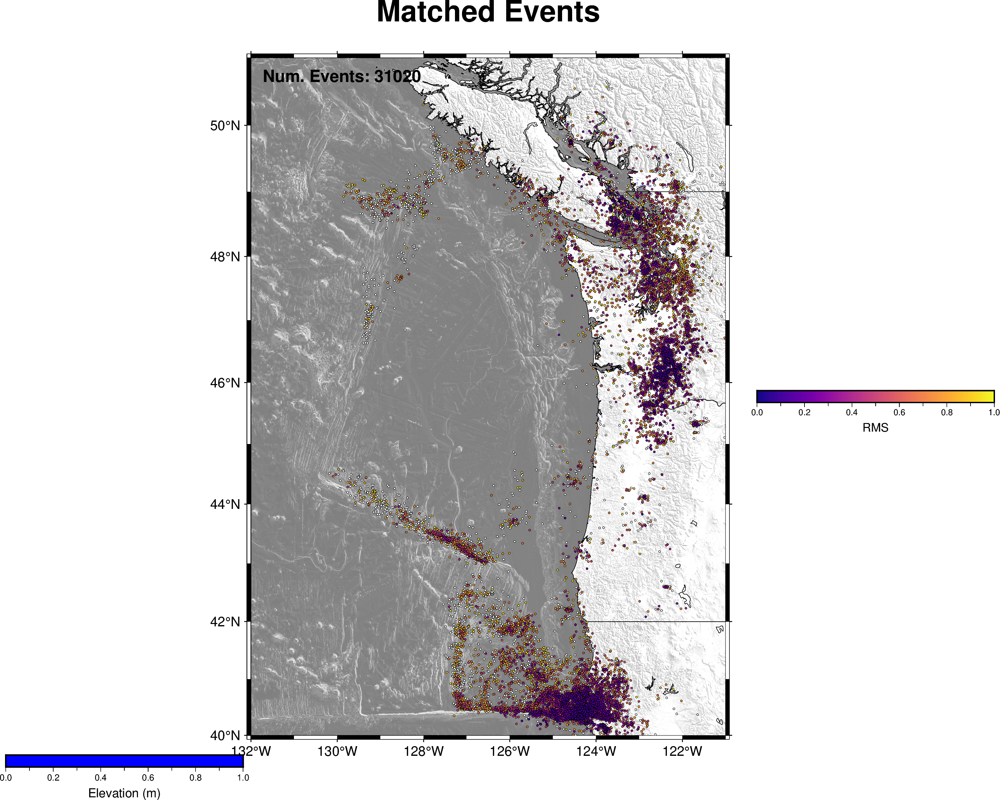

In [18]:
import pygmt
import pandas as pd

# Filter and sort data
_df = df[(df.rms < 2.5) & (df.p_picks > 4) & (df.s_picks > 4)].sort_values('rms', ascending=False)

fig = pygmt.Figure()

# Define target region
min_lat= 40
max_lat=51

min_lon=-132
max_lon=-121

# Load grid data
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=[min_lon, max_lon, min_lat, max_lat])
shade = pygmt.grdgradient(grid=grid, azimuth="0/90", normalize="t1")

region = [min_lon, max_lon, min_lat, max_lat]
title = "Matched Events"
fig.basemap(region=region, projection="M12c", frame=["af", f"WSne+t{title}"])

fig.grdimage(grid=grid, cmap="blue", shading=shade, transparency=50)
fig.coast(region=region, projection="M12c", shorelines=True, borders=[1, 2], resolution="f")
# Plot your seismic events
fig.plot(
    x=_df["lon"],
    y=_df["lat"],
    style="c0.05c",
    color=_df["rms"],
    cmap="plasma",
    pen="0.1p,black"
)

# Add a separate colorbar for the event RMS
fig.colorbar(position="JMR+o0.8c/0c+w6c/0.3c+h", cmap="plasma", frame=["af", "+lRMS"])

# Add bathymetry colorbar
fig.colorbar(position="JBL+o0.2c/0.5c+w6c/0.3c+h", frame=["af", "+lElevation (m)"])

# Add number of events in corner
fig.text(
    text=f"Num. Events: {len(_df)}",
    position="TL",
    offset="j0.3c/0.3c",
    font="12p,Helvetica-Bold,black"
)

# Show plot
fig.show()

/tmp/ipykernel_696099/2182561987.py:28: FutureWarning: The 'color' parameter has been deprecated since v0.8.0 and will be removed in v0.12.0. Please use 'fill' instead.
  fig.plot(


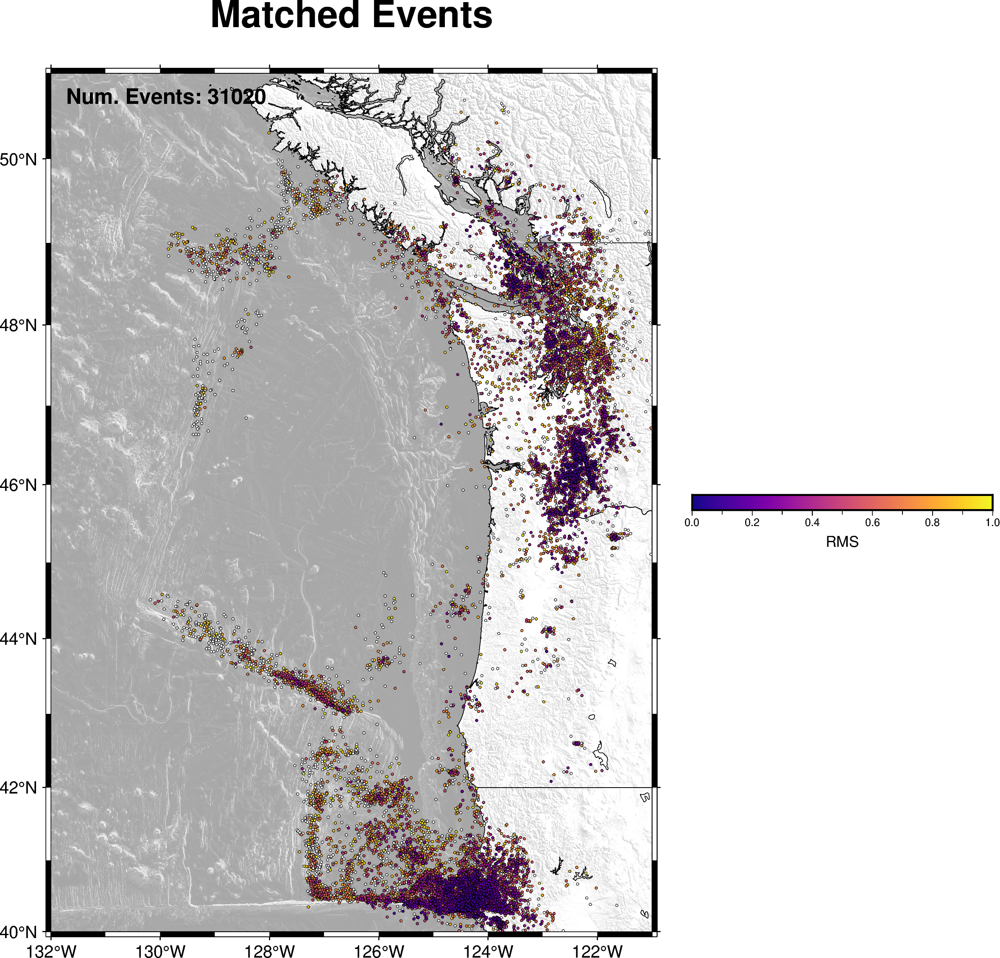

In [4]:
import pygmt
import pandas as pd

# Filter and sort data
_df = df[(df.rms < 2.5) & (df.p_picks > 4) & (df.s_picks > 4)].sort_values('rms', ascending=False)

fig = pygmt.Figure()

# Define target region
min_lat = 40
max_lat = 51
min_lon = -132
max_lon = -121

# Load grid data
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=[min_lon, max_lon, min_lat, max_lat])
shade = pygmt.grdgradient(grid=grid, azimuth="0/90", normalize="t1")

region = [min_lon, max_lon, min_lat, max_lat]
title = "Matched Events"
fig.basemap(region=region, projection="M12c", frame=["af", f"WSne+t{title}"])

# Increase transparency to make the background more transparent
fig.grdimage(grid=grid, cmap="blue", shading=shade, transparency=65)
fig.coast(region=region, projection="M12c", shorelines=True, borders=[1, 2], resolution="f")

# Plot your seismic events
fig.plot(
    x=_df["lon"],
    y=_df["lat"],
    style="c0.05c",
    color=_df["rms"],
    cmap="plasma",
    pen="0.1p,black"
)

# Add a separate colorbar for the event RMS
fig.colorbar(position="JMR+o0.8c/0c+w6c/0.3c+h", cmap="plasma", frame=["af", "+lRMS"])

# Add bathymetry colorbar
# fig.colorbar(position="JBL+o0.2c/0.5c+w6c/0.3c+h", frame=["af", "+lElevation (m)"])

# Add number of events in corner
fig.text(
    text=f"Num. Events: {len(_df)}",
    position="TL",
    offset="j0.3c/0.3c",
    font="12p,Helvetica-Bold,black"
)

# Show plot
fig.show()

/tmp/ipykernel_981377/3462498777.py:77: FutureWarning: The 'color' parameter has been deprecated since v0.8.0 and will be removed in v0.12.0. Please use 'fill' instead.
  fig.plot(x=[-110], y=[48], style="c0.07c", color="white", label="Catalog Event", pen="0.2p,black")
/tmp/ipykernel_981377/3462498777.py:83: FutureWarning: The 'color' parameter has been deprecated since v0.8.0 and will be removed in v0.12.0. Please use 'fill' instead.
  fig.plot(


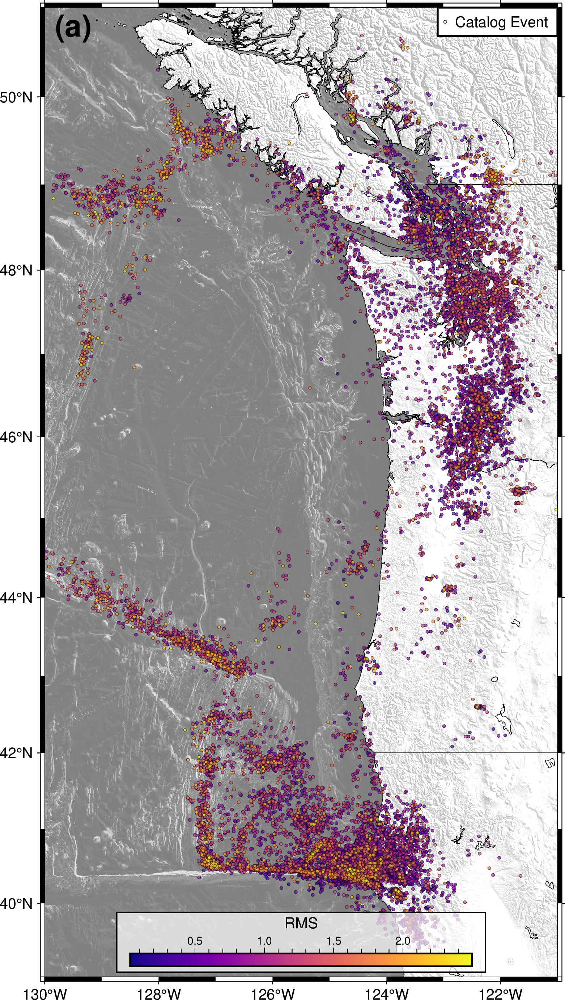

In [25]:
_df = _df.sort_values('rms', ascending=True)

# Parameters for the plot
min_lat = 39
max_lat = 51
min_lon = -130
max_lon = -121

# # Create a list to node sets
# dfs = [df_pnsn_wa, df_pnsn_jdf, df_pnsn_nor, df_pnsn_sor, df_swa_shore, df_swa_shelf_trench,
#        df_nwa_shore, df_nwa_shelf_trench, df_or_shore, df_or_shelf_trench]
# colors = ['#1f78b4', '#a6cee3', '#e31a1c', '#33a02c', '#fb9a99',
#           '#cab2d6', '#fdbf6f', '#ff7f00', '#b2df8a', '#6a3d9a']
# region_names = ['PNSN WA', 'PNSN JdF', 'PNSN N. OR', 'PNSN S. OR', 'S. WA Shore', 'S. WA Shelf & Trench',
#                        'N. WA Shore', 'N. WA Shelf & Trench', 'OR Shore', 'OR Shelf & Trench']

# Initialize the figure
fig = pygmt.Figure()

# Load grid data
grid = pygmt.datasets.load_earth_relief(resolution="15s", region=[min_lon, max_lon, min_lat, max_lat])
shade = pygmt.grdgradient(grid=grid, azimuth="0/90", normalize="t1")

# Define target region
region = [min_lon, max_lon, min_lat, max_lat]
title = "(a)"
# fig.basemap(region=region, projection="M12c", frame=["af", f"WSne+t{title}+o0c/-1c"])
fig.basemap(region=region, projection="M12c", frame="af"
)

fig.grdimage(grid=grid, cmap="blue", shading=shade, transparency=50)
fig.coast(region=region, projection="M12c", shorelines=True, borders=[1, 2], resolution="f")
pygmt.makecpt(cmap="plasma", series=[_df['rms'].min(), _df['rms'].max()])

# Define transformers
transformer_to_utm = Transformer.from_crs("epsg:4326", "epsg:32610", always_xy=True)  # WGS84 to UTM zone 10N
transformer_to_wgs84 = Transformer.from_crs("epsg:32610", "epsg:4326", always_xy=True)  # UTM zone 10N to WGS84

# for df, color,region in zip(dfs, colors,region_names):
#     # Create a list to store the circles
#     circles = []
    
#     # Draw circles at the nodes
#     for idx, row in df.iterrows():
#         lon, lat = row["longitude"], row["latitude"]
#         radius = (row['radius'] + row['buffer_zone']) * 1000  # Convert km to meters
        
#         # Project to UTM
#         x, y = transformer_to_utm.transform(lon, lat)
        
#         # Create circle in UTM coordinates
#         circle = Point(x, y).buffer(radius)
        
#         # Project back to WGS84
#         circle = transform(transformer_to_wgs84.transform, circle)
        
#         circles.append(circle)
    
#     # Create the union of all circles
#     union_circles = unary_union(circles)
    
#     # Convert the union to a GeoDataFrame
#     gdf = gpd.GeoDataFrame(geometry=[union_circles])
    
       
#     # Plot the union of circles
#     for geom in gdf.geometry:
#         if geom.geom_type == 'MultiPolygon':
#             for poly in geom:
#                 x, y = poly.exterior.xy
#                 fig.plot(x=x, y=y, pen=f"1.8p,{color}", label=region)
#         else:
#             x, y = geom.exterior.xy
#             fig.plot(x=x, y=y, pen=f"1.8,{color}", label=region)

# Plot a dummy point to add the station legend
fig.plot(x=[-110], y=[48], style="c0.07c", color="white", label="Catalog Event", pen="0.2p,black")

# Add plate boundaries
# fig.plot(data="PB2002_boundaries.dig", pen="1.3p,dodgerblue4",transparency=50, label="Plate Boundaries")

# Plot the stations
fig.plot(
    x=_df["lon"],
    y=_df["lat"],
    style="c0.07c",
    color=_df["rms"],
    cmap=True,
    pen="0.1p,black",
    transparency=30
)

fig.text(
    x=-129.5, y=50.8, text=title,
    font="20p,Helvetica-Bold,black",
    no_clip=True    # This prevents the text from being clipped
)

# Add the legend to the plot
fig.legend(position="JTR+w2.8+jTR", box='+gwhite+p1p')
fig.colorbar(
    # Place the colorbar inside the plot (lowercase "j") in the Bottom Right (BR)
    # corner with an offset ("+o") of 0.7 centimeters and 0.3 centimeters in x or y
    # directions, respectively; move the x label above the horizontal colorbar ("+ml")
    position="jBC+o0.0c/0.25c+h+w8c/0.3c+ml",
    # Add a box around the colobar with a fill ("+g") in "white" color and a
    # transparency ("@") of 30 % and with a 0.8-points thick, black, outline ("+p")
    box="+gwhite@30+p0.8p,black",
    # Add x and y labels ("+l")
    frame=["x+lRMS"],
)
# Save and display the figure
fig.savefig("../data/datasets_all_regions/all_catalog_events_2010_2015_ver3.pdf")
# fig.savefig("../data/datasets_all_regions/stas_wo_boundaries_2010_2015_ver3.png", dpi=500)

fig.show()

In [10]:
import pygmt

# Create a CPT using pygmt.makecpt
pygmt.makecpt(
    cmap="oleron",  # Good diverging CPT for bathymetry
    series="-8000/0/500",  # Depth range in meters
    continuous=True
)

# Continue with the rest of the code
fig.grdimage(
    grid=grid,
    region=region,
    projection="M8i",
    shading=True,
    cmap=True,
    nan_transparent=True
)

grdimage [ERROR]: Option -Q: Cannot specify a transparent color for grids when intensities are also used


### Filter by gap

#### P and S Picks > 4 and Gap=180+/-10 (°)

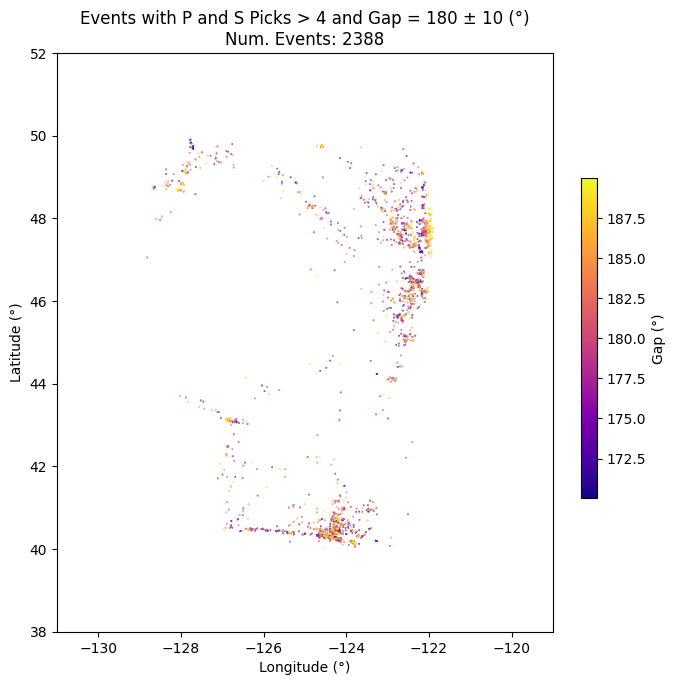

In [163]:
plt.figure(figsize=(8, 8))
tol_deg = 10
# Filter and sort the data
_df = df[(abs(180-df.gap) < tol_deg) & (df.p_picks > 4) & (df.s_picks > 4)].sort_values('gap', ascending=True)

# Create the scatter plot
scatter = plt.scatter(
    _df['lon'], _df['lat'], 
    c=_df['gap'], cmap='plasma', s=0.1
)

# Add a colorbar with a label
cbar = plt.colorbar(scatter, label='Gap (°)')
cbar.ax.set_position([0.78, 0.3, 0.03, 0.4])  # Adjust colorbar position

# Add labels, title, and axis limits
plt.xlabel('Longitude (°)')
plt.ylabel('Latitude (°)')
plt.title(f'Events with P and S Picks > 4 and Gap = 180 ± {tol_deg} (°)\nNum. Events: {len(_df)}')
plt.xlim(-131, -119)
plt.ylim(38, 52)

# Ensure the aspect ratio is equal
plt.gca().set_aspect('equal', adjustable='box')

# Show the plot
plt.show()

#### P and S Picks > 4 and Gap=180+/-15 (°)

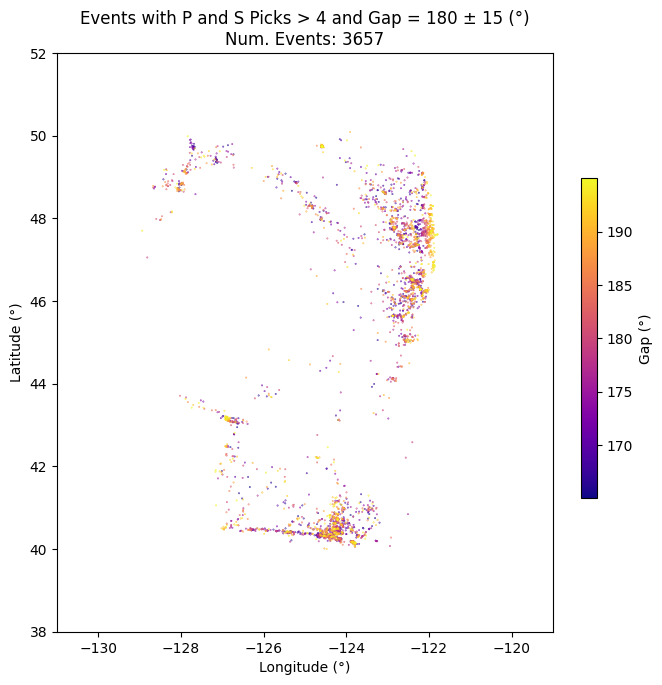

In [164]:
plt.figure(figsize=(8, 8))
tol_deg = 15
# Filter and sort the data
_df = df[(abs(180-df.gap) < tol_deg) & (df.p_picks > 4) & (df.s_picks > 4)].sort_values('gap', ascending=True)

# Create the scatter plot
scatter = plt.scatter(
    _df['lon'], _df['lat'], 
    c=_df['gap'], cmap='plasma', s=0.1
)

# Add a colorbar with a label
cbar = plt.colorbar(scatter, label='Gap (°)')
cbar.ax.set_position([0.78, 0.3, 0.03, 0.4])  # Adjust colorbar position

# Add labels, title, and axis limits
plt.xlabel('Longitude (°)')
plt.ylabel('Latitude (°)')
plt.title(f'Events with P and S Picks > 4 and Gap = 180 ± {tol_deg} (°)\nNum. Events: {len(_df)}')
plt.xlim(-131, -119)
plt.ylim(38, 52)

# Ensure the aspect ratio is equal
plt.gca().set_aspect('equal', adjustable='box')

# Show the plot
plt.show()

#### P and S Picks > 4 and Gap=180+/-20 (°)

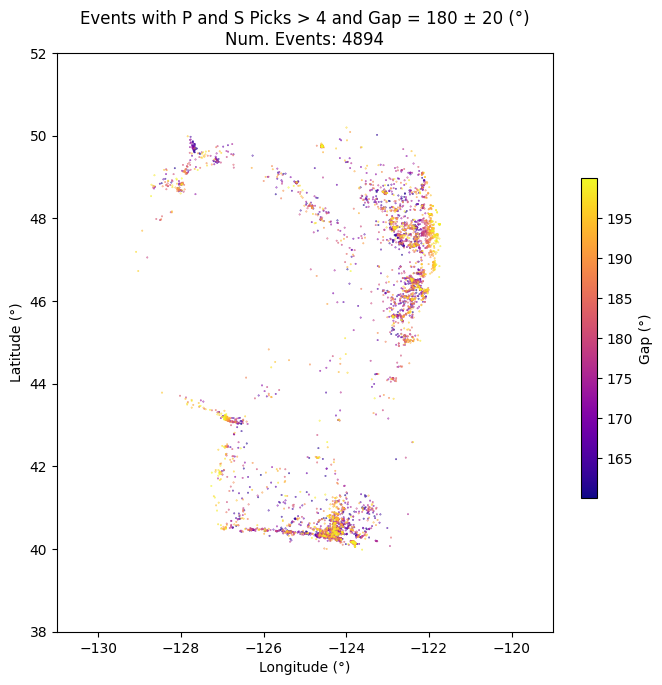

In [165]:
plt.figure(figsize=(8, 8))
tol_deg = 20
# Filter and sort the data
_df = df[(abs(180-df.gap) < tol_deg) & (df.p_picks > 4) & (df.s_picks > 4)].sort_values('gap', ascending=True)

# Create the scatter plot
scatter = plt.scatter(
    _df['lon'], _df['lat'], 
    c=_df['gap'], cmap='plasma', s=0.1
)

# Add a colorbar with a label
cbar = plt.colorbar(scatter, label='Gap (°)')
cbar.ax.set_position([0.78, 0.3, 0.03, 0.4])  # Adjust colorbar position

# Add labels, title, and axis limits
plt.xlabel('Longitude (°)')
plt.ylabel('Latitude (°)')
plt.title(f'Events with P and S Picks > 4 and Gap = 180 ± {tol_deg} (°)\nNum. Events: {len(_df)}')
plt.xlim(-131, -119)
plt.ylim(38, 52)

# Ensure the aspect ratio is equal
plt.gca().set_aspect('equal', adjustable='box')

# Show the plot
plt.show()

#### P and S Picks > 4 and Gap=180+/-25 (°)

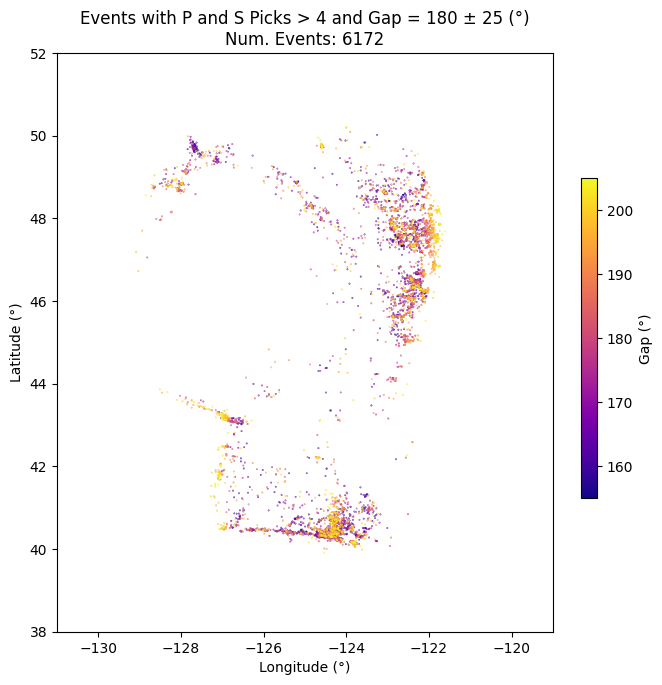

In [166]:
plt.figure(figsize=(8, 8))
tol_deg = 25
# Filter and sort the data
_df = df[(abs(180-df.gap) < tol_deg) & (df.p_picks > 4) & (df.s_picks > 4)].sort_values('gap', ascending=True)

# Create the scatter plot
scatter = plt.scatter(
    _df['lon'], _df['lat'], 
    c=_df['gap'], cmap='plasma', s=0.1
)

# Add a colorbar with a label
cbar = plt.colorbar(scatter, label='Gap (°)')
cbar.ax.set_position([0.78, 0.3, 0.03, 0.4])  # Adjust colorbar position

# Add labels, title, and axis limits
plt.xlabel('Longitude (°)')
plt.ylabel('Latitude (°)')
plt.title(f'Events with P and S Picks > 4 and Gap = 180 ± {tol_deg} (°)\nNum. Events: {len(_df)}')
plt.xlim(-131, -119)
plt.ylim(38, 52)

# Ensure the aspect ratio is equal
plt.gca().set_aspect('equal', adjustable='box')

# Show the plot
plt.show()

#### P and S Picks > 4 and Gap=180+/-30 (°)

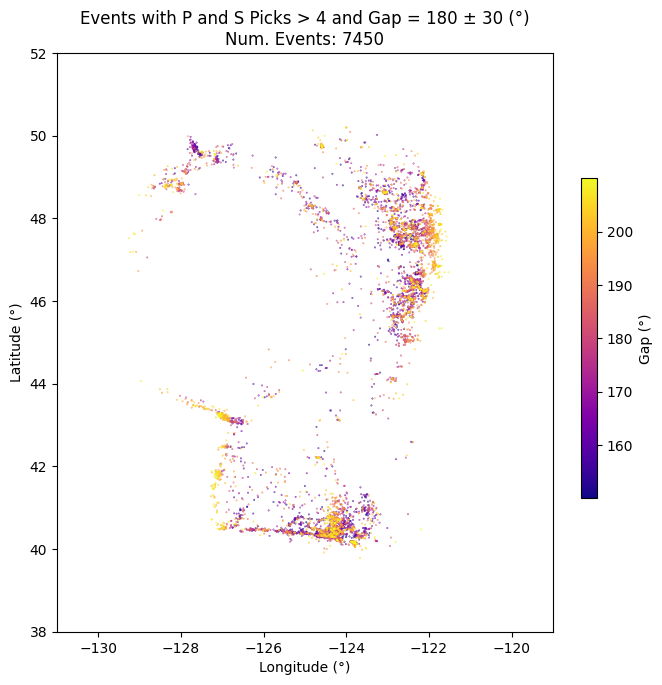

In [167]:
plt.figure(figsize=(8, 8))
tol_deg = 30
# Filter and sort the data
_df = df[(abs(180-df.gap) < tol_deg) & (df.p_picks > 4) & (df.s_picks > 4)].sort_values('gap', ascending=True)

# Create the scatter plot
scatter = plt.scatter(
    _df['lon'], _df['lat'], 
    c=_df['gap'], cmap='plasma', s=0.1
)

# Add a colorbar with a label
cbar = plt.colorbar(scatter, label='Gap (°)')
cbar.ax.set_position([0.78, 0.3, 0.03, 0.4])  # Adjust colorbar position

# Add labels, title, and axis limits
plt.xlabel('Longitude (°)')
plt.ylabel('Latitude (°)')
plt.title(f'Events with P and S Picks > 4 and Gap = 180 ± {tol_deg} (°)\nNum. Events: {len(_df)}')
plt.xlim(-131, -119)
plt.ylim(38, 52)

# Ensure the aspect ratio is equal
plt.gca().set_aspect('equal', adjustable='box')

# Show the plot
plt.show()

#### P and S Picks > 4 and Gap=180+/-40 (°)

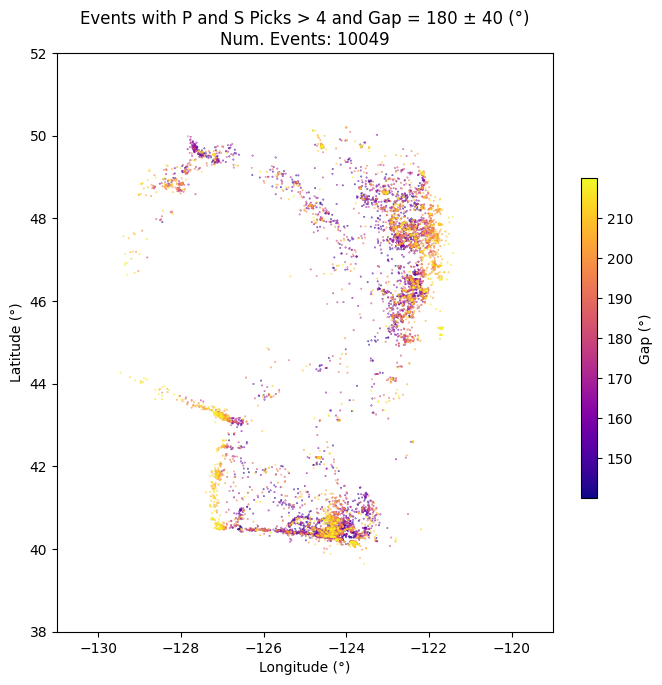

In [168]:
plt.figure(figsize=(8, 8))
tol_deg = 40
# Filter and sort the data
_df = df[(abs(180-df.gap) < tol_deg) & (df.p_picks > 4) & (df.s_picks > 4)].sort_values('gap', ascending=True)

# Create the scatter plot
scatter = plt.scatter(
    _df['lon'], _df['lat'], 
    c=_df['gap'], cmap='plasma', s=0.1
)

# Add a colorbar with a label
cbar = plt.colorbar(scatter, label='Gap (°)')
cbar.ax.set_position([0.78, 0.3, 0.03, 0.4])  # Adjust colorbar position

# Add labels, title, and axis limits
plt.xlabel('Longitude (°)')
plt.ylabel('Latitude (°)')
plt.title(f'Events with P and S Picks > 4 and Gap = 180 ± {tol_deg} (°)\nNum. Events: {len(_df)}')
plt.xlim(-131, -119)
plt.ylim(38, 52)

# Ensure the aspect ratio is equal
plt.gca().set_aspect('equal', adjustable='box')

# Show the plot
plt.show()

### Non-Dimensional Distance Equation

The non-dimensional distance is defined as:

$$
\text{NonDimDist} = \sqrt{\left(\frac{\Delta t}{120}\right)^2 + \left(\frac{\Delta x}{25}\right)^2}
$$

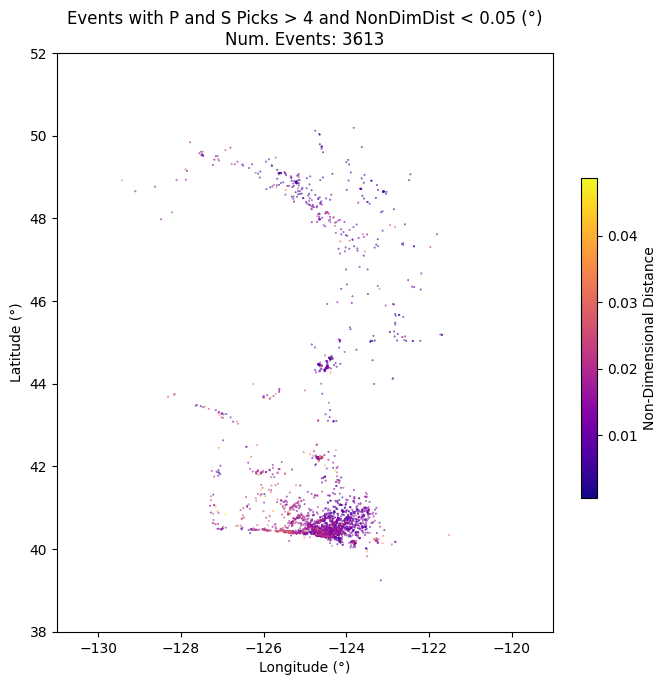

In [173]:
plt.figure(figsize=(8, 8))
tol_deg = 40
# Filter and sort the data
_df = df[(df['NonDimDist'] < 0.05)].sort_values('NonDimDist', ascending=True)

# Create the scatter plot
scatter = plt.scatter(
    _df['lon'], _df['lat'], 
    c=_df['NonDimDist'], cmap='plasma', s=0.1
)

# Add a colorbar with a label
cbar = plt.colorbar(scatter, label='Non-Dimensional Distance')
cbar.ax.set_position([0.78, 0.3, 0.03, 0.4])  # Adjust colorbar position

# Add labels, title, and axis limits
plt.xlabel('Longitude (°)')
plt.ylabel('Latitude (°)')
plt.title(f'Events with P and S Picks > 4 and NonDimDist < 0.05 (°)\nNum. Events: {len(_df)}')
plt.xlim(-131, -119)
plt.ylim(38, 52)

# Ensure the aspect ratio is equal
plt.gca().set_aspect('equal', adjustable='box')

# Show the plot
plt.show()

### Combine the filters 

#### P and S Picks > 4, RMS < 1.5 and Gap = 180 ± 25 (°)

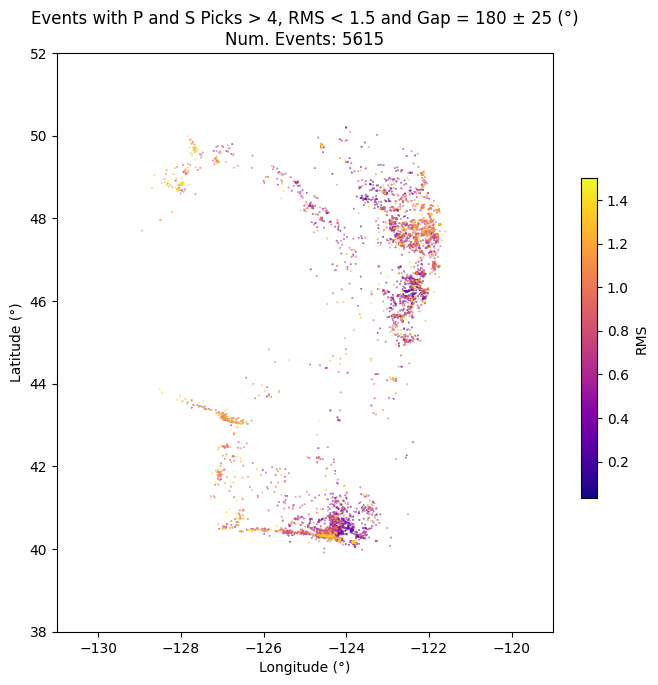

In [170]:
plt.figure(figsize=(8, 8))
tol_deg = 25
# Filter and sort the data
_df = df[(df.rms<1.5)&(abs(180-df.gap) < tol_deg) & (df.p_picks > 4) & (df.s_picks > 4)].sort_values('rms', ascending=True)

# Create the scatter plot
scatter = plt.scatter(
    _df['lon'], _df['lat'], 
    c=_df['rms'], cmap='plasma', s=0.1
)

# Add a colorbar with a label
cbar = plt.colorbar(scatter, label='RMS')
cbar.ax.set_position([0.78, 0.3, 0.03, 0.4])  # Adjust colorbar position

# Add labels, title, and axis limits
plt.xlabel('Longitude (°)')
plt.ylabel('Latitude (°)')
plt.title(f'Events with P and S Picks > 4, RMS < 1.5 and Gap = 180 ± {tol_deg} (°)\nNum. Events: {len(_df)}')
plt.xlim(-131, -119)
plt.ylim(38, 52)

# Ensure the aspect ratio is equal
plt.gca().set_aspect('equal', adjustable='box')

# Show the plot
plt.show()

#### Zoom into offshore WA

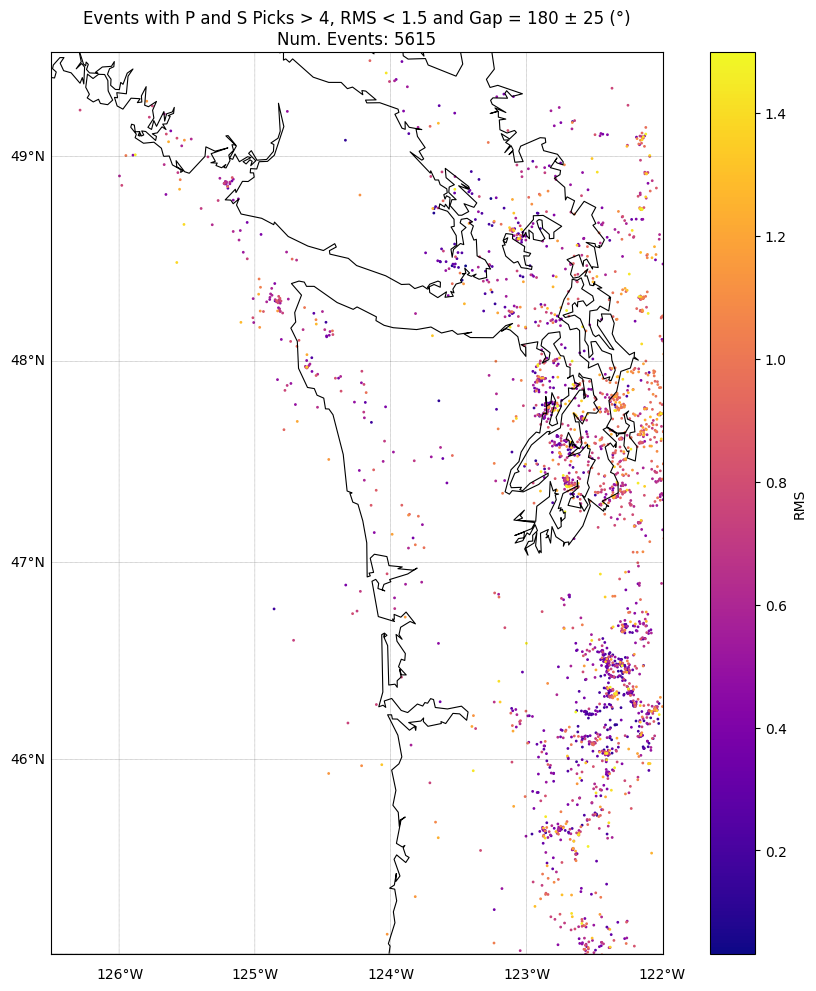

In [172]:
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt

# Filter and sort the data
tol_deg = 25
_df = df[(df.rms < 1.5) & (abs(180 - df.gap) < tol_deg) & (df.p_picks > 4) & (df.s_picks > 4)].sort_values('rms', ascending=True)

# Set up figure
plt.figure(figsize=(10, 10))

# Create map
m = Basemap(
    projection='merc',
    llcrnrlon=-126.5, urcrnrlon=-122,
    llcrnrlat=45, urcrnrlat=49.5,
    resolution='i'
)

# Draw coastlines
m.drawcoastlines(color='black', linewidth=0.8)

# Add lat/lon grid lines with labels
parallels = range(45, 50, 1)
meridians = range(-127, -121, 1)

m.drawparallels(parallels, labels=[1,0,0,0], linewidth=0.2, fontsize=10)
m.drawmeridians(meridians, labels=[0,0,0,1], linewidth=0.2, fontsize=10)

# Convert coords and plot
x, y = m(_df['lon'].values, _df['lat'].values)
scatter = m.scatter(x, y, c=_df['rms'], cmap='plasma', s=1)

# Colorbar
cbar = plt.colorbar(scatter, label='RMS')
cbar.ax.set_position([0.85, 0.3, 0.03, 0.4])

# Title
plt.title(f'Events with P and S Picks > 4, RMS < 1.5 and Gap = 180 ± {tol_deg} (°)\nNum. Events: {len(_df)}')

plt.tight_layout()
plt.show()
